# DISPATCH Adversarial Patch Defense Experiment

## Automatic Localization vs Known Patch Location

This executed notebook is the teacher-facing experiment report.

**Writable project:** `D:\project CS\DISPATCH-Teacher-Notebook`  
**Read-only dependencies:** DISPATCH-Defense, DISPATCH-Paper-Faithful, Hyper-YOLO, Adversarial-Patch-Experiment, Stable-Diffusion-Patch

Student name and ID are not filled here because they were not provided in the project files.


## 2. Objective

This notebook demonstrates a **5-image diagnostic** comparison between:

1. **Automatic DISPATCH** (paper/source-faithful): no true patch coordinates.
2. **Known Location** restoration: attacked image + saved true patch mask (exact, and +4 px).

**CLEAN images are not restoration input.** They are only for Hyper-YOLO baseline, visual reference, and evaluation.

**LDM always sees the attacked/patched image.**

Research questions:

1. Can Automatic DISPATCH localize adversarial patches?
2. Can diffusion rectification recover Hyper-YOLO targets (same class, IoU ≥ 0.50)?
3. What happens if the exact patch location is provided?
4. Is failure caused mainly by localization or restoration?

Terminology used below: **diagnostic subset recovery rate** — **not** final DISPATCH DRR and **not** the paper mAP@0.5.


## 3. Experiment pipelines

**Automatic (paper-faithful MaJinWakeUp/DisPatch):**

Attacked → 512 resize → complementary checkerboard N=32 → batched CompVis LDM (DDIM 5) → full regenerated image → RGB [0,1] L2 → Gaussian (k=15, σ=1.0) → KMeans k=2 (higher centroid = suspicious) → MORPH_OPEN 3×3 → predicted mask → rectify `A·Ĩ + (1-A)·I` → Hyper-YOLO

**Known Location (oracle diagnostic):**

Attacked + true mask (exact or +4 px) → CompVis inpaint → composite inside mask only → Hyper-YOLO


In [1]:
from pathlib import Path
import json, os, subprocess, sys
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from IPython.display import display

%matplotlib inline

ROOT = Path.cwd().resolve()
if ROOT.name != "DISPATCH-Teacher-Notebook":
    ROOT = Path(r"D:\project CS\DISPATCH-Teacher-Notebook")
os.chdir(ROOT)
sys.path.insert(0, str(ROOT))
from helpers.safety import load_config, PROJECT_ROOT, subprocess_env
CFG = load_config()
DISPATCH_PY = CFG["dispatch_python"]
print("Project root:", ROOT)
print("Writes allowed only under:", PROJECT_ROOT)
print("config.json loaded.")


Project root: D:\project CS\DISPATCH-Teacher-Notebook
Writes allowed only under: D:\project CS\DISPATCH-Teacher-Notebook
config.json loaded.


In [2]:
import platform, shutil
print("Python:", sys.version)
try:
    env = subprocess_env([str(ROOT), CFG["paper_faithful_root"], CFG["official_ldm_root"], CFG["taming_root"], CFG["dispatch_root"]])
    out = subprocess.check_output([DISPATCH_PY, "-c",
        "import torch,sys; print('torch', torch.__version__); print('cuda', torch.cuda.is_available()); print('gpu', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'none')"],
        text=True, env=env)
    print(out)
except Exception as e:
    print("Could not query DISPATCH env:", e)
print("LDM checkpoint:", CFG["ldm_checkpoint"], "exists=", Path(CFG["ldm_checkpoint"]).is_file())
print("Hyper-YOLO weights:", CFG["hyper_yolo_weights"], "exists=", Path(CFG["hyper_yolo_weights"]).is_file())
print("DDIM steps:", CFG["ddim_steps"], "N:", CFG["checkerboard_n"])
print("Gaussian kernel:", CFG["gaussian_kernel"], "sigma:", CFG["gaussian_sigma"])
print("KMeans k:", CFG["kmeans_k"], "MORPH_OPEN:", CFG["morph_open"])
print("seed:", CFG["seed"])
print("official commit:", CFG["official_commit"])


Python: 3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]


torch 2.5.1+cu121
cuda True
gpu NVIDIA GeForce RTX 2050

LDM checkpoint: D:\project CS\DISPATCH-Defense\third_party\latent-diffusion\models\ldm\inpainting_big\last.ckpt exists= True
Hyper-YOLO weights: D:\project CS\Hyper-YOLO\weights\hyper-yolon.pt exists= True
DDIM steps: 5 N: 32
Gaussian kernel: 15 sigma: 1.0
KMeans k: 2 MORPH_OPEN: 3
seed: 20260817
official commit: 80c59b9b4a6c4060107a8b4485d3885128c2ae81


## 5. Selected images

Verified against frozen testing_mitigations/mitigation_02 metadata before copy. Values below are from the local `selected_images.csv`.


In [3]:
sel = pd.read_csv(ROOT / "source_data" / "source_attack_data" / "selected_images.csv")
show = sel[["filename","target_class","case_type","gt_x","gt_y","gt_width","gt_height","patch_x1","patch_y1","patch_x2","patch_y2","patch_size"]].copy()
show.columns = ["filename","target","case","gt_x","gt_y","gt_w","gt_h","patch_x1","patch_y1","patch_x2","patch_y2","patch_size"]
display(show)
print("Attack-success cases:", int((sel.case_type=="attack_success").sum()), "| controls:", int((sel.case_type=="control").sum()))


,filename,target,case,gt_x,gt_y,gt_w,gt_h,patch_x1,patch_y1,patch_x2,patch_y2,patch_size
0,000000127263.jpg,car,attack_success,501.43,106.88,138.57,67.52,561,131,581,151,20
1,000000393093.jpg,car,attack_success,282.56,355.03,75.76,46.45,313,371,327,385,14
2,000000026926.jpg,car,attack_success,134.13,159.86,74.46,85.28,160,192,182,214,22
3,000000407083.jpg,car,attack_success,0.00,1.66,480.00,623.38,168,241,312,385,144
4,000000331604.jpg,person,control,295.96,149.79,69.38,141.59,320,210,341,231,21


Attack-success cases: 4 | controls: 1


## 6. Clean vs attacked (clean is reference only)

Left = clean COCO reference. Right = **attacked input used by LDM**.


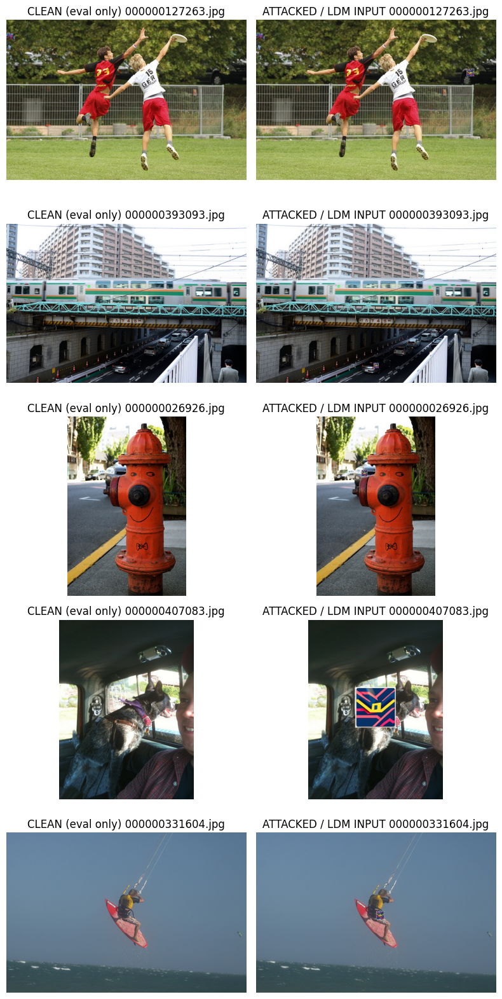

In [4]:
files = list(sel["filename"])
fig, axes = plt.subplots(len(files), 2, figsize=(8, 3.2*len(files)))
for i, fn in enumerate(files):
    axes[i,0].imshow(Image.open(ROOT/"source_data"/"clean_images"/fn))
    axes[i,0].set_title(f"CLEAN (eval only) {fn}")
    axes[i,0].axis("off")
    axes[i,1].imshow(Image.open(ROOT/"source_data"/"attacked_images"/fn))
    axes[i,1].set_title(f"ATTACKED / LDM INPUT {fn}")
    axes[i,1].axis("off")
plt.tight_layout()
plt.show()


## 7. Automatic paper-faithful DISPATCH (executed)

True patch coordinates are **not** passed into localization. LDM input = attacked image.


In [5]:
def run_helper(args):
    env = subprocess_env([
        str(ROOT),
        CFG["paper_faithful_root"],
        CFG["official_ldm_root"],
        CFG["taming_root"],
        CFG["dispatch_root"],
        CFG["hyper_yolo_root"],
    ])
    print("RUN", args)
    p = subprocess.run([DISPATCH_PY, *args], cwd=str(ROOT), env=env)
    if p.returncode != 0:
        raise RuntimeError(f"helper failed rc={p.returncode}: {args}")
    print("OK", args)

run_helper([str(ROOT/"helpers"/"dispatch_runner.py"), "automatic"])
print((ROOT/"automatic"/"results"/"summary.txt").read_text(encoding="utf-8"))


RUN ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\dispatch_runner.py', 'automatic']


OK ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\dispatch_runner.py', 'automatic']
AUTOMATIC PAPER-FAITHFUL DISPATCH (diagnostic subset — NOT DRR)
N=32 steps=5 Gaussian k=15 sigma=1.0 MORPH_OPEN=3x3
mean mask IoU=0.0494
mean precision=0.0681
mean recall=0.7942
True patch was evaluation-only. LDM input = attacked image only.



## 8. Automatic visualization

ATTACKED | PREDICTED MASK | REGENERATED (intermediate, **not final**) | FINAL AUTOMATIC RESTORED


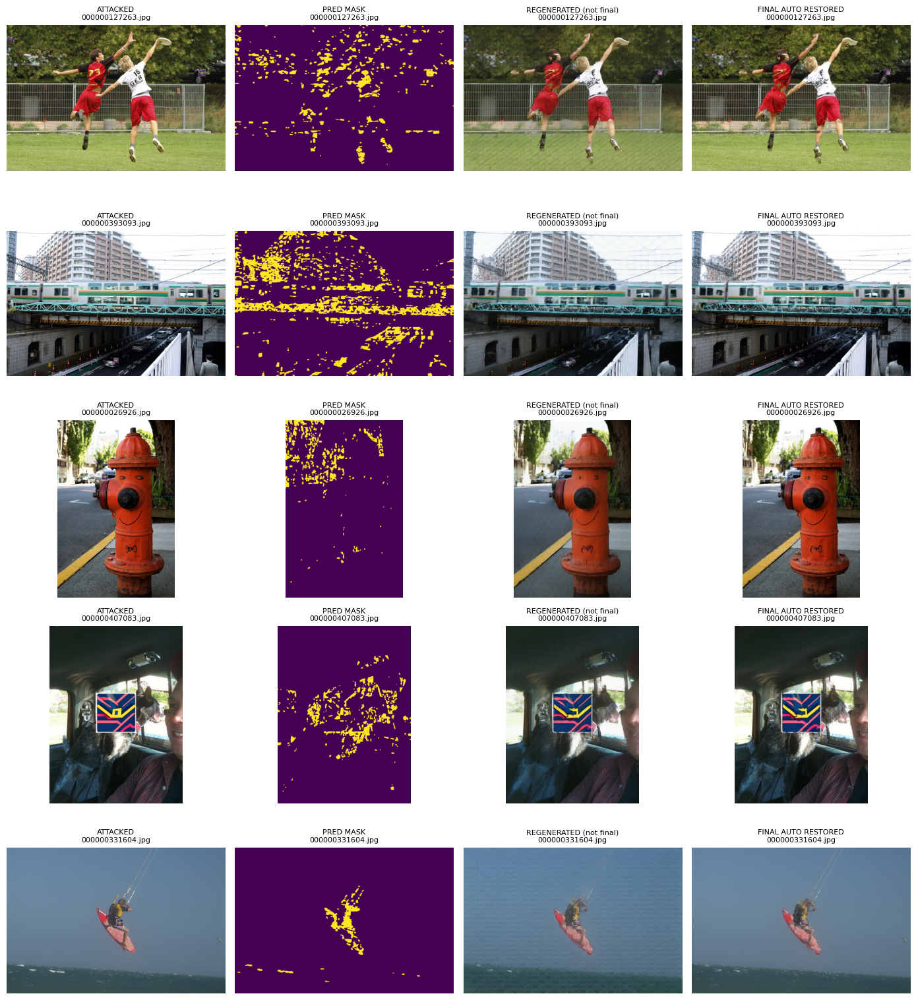

In [6]:
fig, axes = plt.subplots(len(files), 4, figsize=(14, 3.1*len(files)))
for i, fn in enumerate(files):
    stem = Path(fn).stem
    imgs = [
        (ROOT/"source_data"/"attacked_images"/fn, "ATTACKED"),
        (ROOT/"automatic"/"masks"/"predicted_masks"/f"{stem}.png", "PRED MASK"),
        (ROOT/"automatic"/"regenerated_images"/fn, "REGENERATED (not final)"),
        (ROOT/"automatic"/"restored_images"/fn, "FINAL AUTO RESTORED"),
    ]
    for j,(p,t) in enumerate(imgs):
        axes[i,j].imshow(Image.open(p))
        axes[i,j].set_title(f"{t}\n{fn}", fontsize=8)
        axes[i,j].axis("off")
plt.tight_layout(); plt.show()


## 9. Automatic localization metrics (true mask = evaluation only)


In [7]:
auto = pd.read_csv(ROOT/"automatic"/"results"/"per_image_results.csv")
display(auto[["filename","true_patch_area","predicted_mask_area","mask_iou","precision","recall"]])
print("mean IoU", auto.mask_iou.mean(), "mean P", auto.precision.mean(), "mean R", auto.recall.mean())


,filename,true_patch_area,predicted_mask_area,mask_iou,precision,recall
0,000000127263.jpg,400,19194,0.019512,0.019537,0.937500
1,000000393093.jpg,196,44080,0.004333,0.004333,0.974490
2,000000026926.jpg,484,15405,0.026952,0.027069,0.861570
3,000000407083.jpg,20736,19987,0.111830,0.204933,0.197531
4,000000331604.jpg,441,5213,0.084596,0.084596,1.000000


mean IoU 0.049444533274005505 mean P 0.06809378561245512 mean R 0.7942181816099565


## 10. Known Location (oracle mask)

Same attacked images. Exact saved square, then expanded 4 px. No KMeans.


In [8]:
run_helper([str(ROOT/"helpers"/"dispatch_runner.py"), "known"])
print((ROOT/"known_location"/"results"/"summary.txt").read_text(encoding="utf-8"))


RUN ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\dispatch_runner.py', 'known']


OK ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\dispatch_runner.py', 'known']
KNOWN LOCATION (oracle mask — diagnostic, not Automatic DISPATCH)
LDM input = attacked image + binary mask. Clean pixels never composited.
mean outside MAE exact=0.00000000
mean outside MAE +4=0.00000000



## 11. Known Location visualization


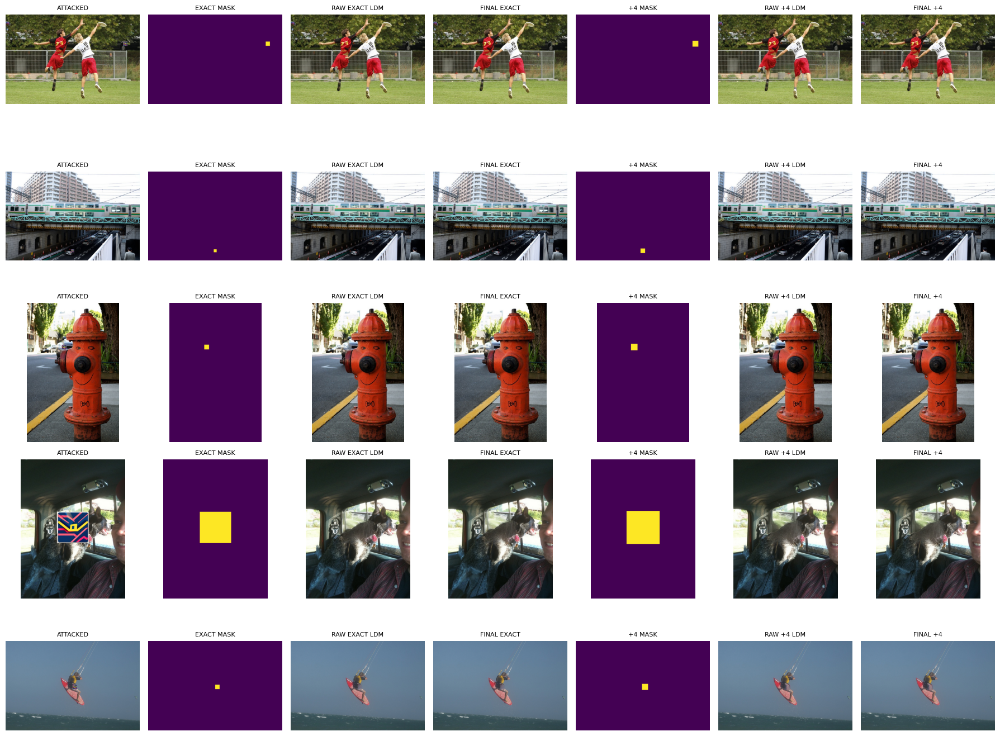

In [9]:
fig, axes = plt.subplots(len(files), 7, figsize=(18, 2.8*len(files)))
for i, fn in enumerate(files):
    stem = Path(fn).stem
    cols = [
        (ROOT/"source_data"/"attacked_images"/fn, "ATTACKED"),
        (ROOT/"known_location"/"masks"/"exact_mask"/f"{stem}.png", "EXACT MASK"),
        (ROOT/"known_location"/"ldm_outputs"/"exact_mask"/fn, "RAW EXACT LDM"),
        (ROOT/"known_location"/"restored_images"/"exact_mask"/fn, "FINAL EXACT"),
        (ROOT/"known_location"/"masks"/"expanded_4px"/f"{stem}.png", "+4 MASK"),
        (ROOT/"known_location"/"ldm_outputs"/"expanded_4px"/fn, "RAW +4 LDM"),
        (ROOT/"known_location"/"restored_images"/"expanded_4px"/fn, "FINAL +4"),
    ]
    for j,(p,t) in enumerate(cols):
        axes[i,j].imshow(Image.open(p))
        axes[i,j].set_title(t, fontsize=8)
        axes[i,j].axis("off")
plt.tight_layout(); plt.show()


## 12. Hyper-YOLO (conf=0.25, iou=0.70, imgsz=640, cpu)

Match rule: predicted class == image target class AND GT IoU ≥ 0.50.


In [10]:
run_helper([str(ROOT/"helpers"/"hyper_yolo_runner.py")])
print((ROOT/"comparison"/"summary.txt").read_text(encoding="utf-8"))


RUN ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\hyper_yolo_runner.py']


OK ['D:\\project CS\\DISPATCH-Teacher-Notebook\\helpers\\hyper_yolo_runner.py']
DIAGNOSTIC SUBSET RECOVERY RATE (5-image notebook — NOT DISPATCH DRR, NOT paper mAP)
Automatic recovered: 0 / 4
Known Exact recovered: 2 / 4
Known +4px recovered: 2 / 4
Automatic mean mask IoU: 0.0494
Automatic controls preserved: 1 / 1
Known exact controls preserved: 1 / 1
Known +4 controls preserved: 1 / 1



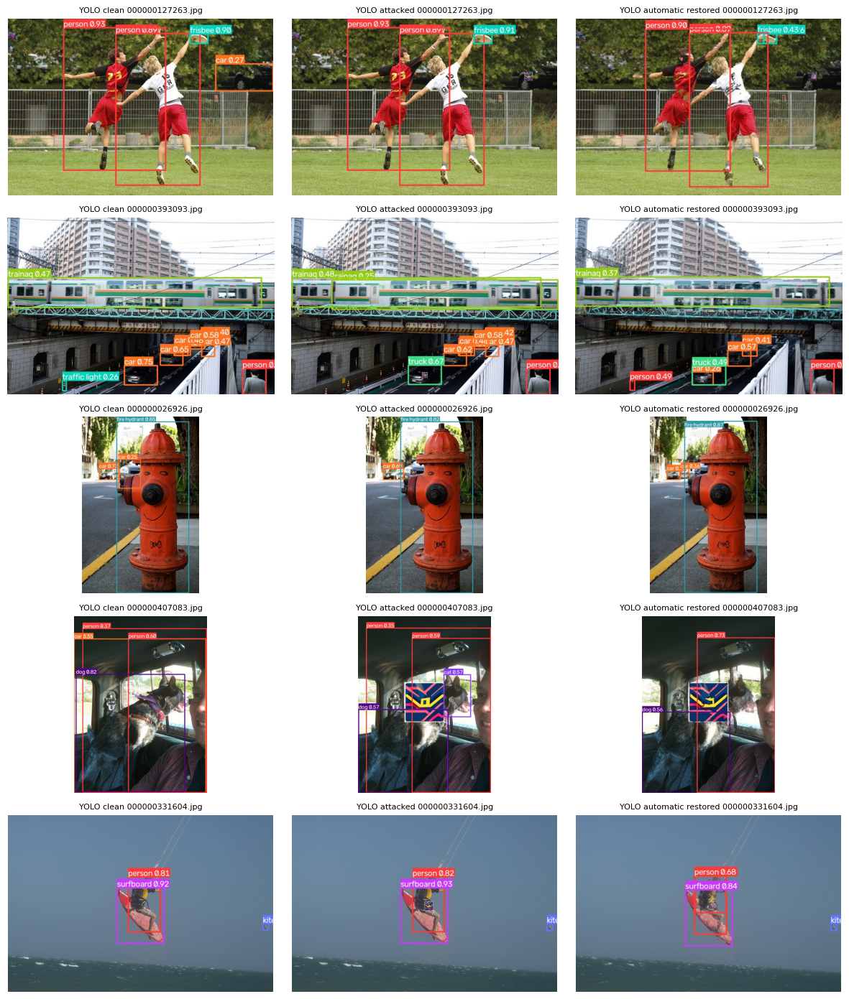

In [11]:
fig, axes = plt.subplots(len(files), 3, figsize=(12, 2.8*len(files)))
for i, fn in enumerate(files):
    for j,(p,t) in enumerate([
        (ROOT/"automatic"/"results"/"clean_predictions"/"images"/fn, "YOLO clean"),
        (ROOT/"automatic"/"results"/"attacked_predictions"/"images"/fn, "YOLO attacked"),
        (ROOT/"automatic"/"results"/"restored_predictions"/"images"/fn, "YOLO automatic restored"),
    ]):
        axes[i,j].imshow(Image.open(p))
        axes[i,j].set_title(f"{t} {fn}", fontsize=8)
        axes[i,j].axis("off")
plt.tight_layout(); plt.show()


## 13. Per-image results


In [12]:
cmp = pd.read_csv(ROOT/"comparison"/"automatic_vs_known.csv")
display(cmp)
cmp.to_csv(ROOT/"comparison"/"per_image_results.csv", index=False)
print("Saved comparison/per_image_results.csv")


,filename,target,case,clean_detected,clean_confidence,clean_iou,attacked_detected,attacked_confidence,attacked_iou,automatic_mask_iou,...,known_expand4_detected,known_expand4_confidence,known_expand4_iou,known_expand4_recovered,outside_mask_mae_exact,outside_mask_mae_expand4,automatic_control_preserved,known_exact_control_preserved,known_expand4_control_preserved,interpretation
0,000000127263.jpg,car,attack_success,True,0.273682,0.930571,False,NaN,NaN,0.019512,...,False,NaN,NaN,False,0.0,0.0,False,False,False,Case C: both fail — localization alone does no...
1,000000393093.jpg,car,attack_success,True,0.750488,0.940163,False,NaN,NaN,0.004333,...,True,0.520020,0.925937,True,0.0,0.0,False,False,False,Case A: Automatic fail / known succeed — local...
2,000000026926.jpg,car,attack_success,True,0.253418,0.760126,False,NaN,NaN,0.026952,...,False,NaN,NaN,False,0.0,0.0,False,False,False,Case C: both fail — localization alone does no...
3,000000407083.jpg,car,attack_success,True,0.352539,0.839036,False,NaN,NaN,0.111830,...,True,0.420410,0.814532,True,0.0,0.0,False,False,False,Case A: Automatic fail / known succeed — local...
4,000000331604.jpg,person,control,True,0.808105,0.844226,True,0.819336,0.854625,0.084596,...,True,0.819336,0.851487,False,0.0,0.0,True,True,True,control


Saved comparison/per_image_results.csv


## 14. Comparison table


In [13]:
view = cmp[["filename","target","case","automatic_recovered","known_exact_recovered","known_expand4_recovered","automatic_mask_iou","interpretation"]].copy()
display(view)


,filename,target,case,automatic_recovered,known_exact_recovered,known_expand4_recovered,automatic_mask_iou,interpretation
0,000000127263.jpg,car,attack_success,False,False,False,0.019512,Case C: both fail — localization alone does no...
1,000000393093.jpg,car,attack_success,False,True,True,0.004333,Case A: Automatic fail / known succeed — local...
2,000000026926.jpg,car,attack_success,False,False,False,0.026952,Case C: both fail — localization alone does no...
3,000000407083.jpg,car,attack_success,False,True,True,0.111830,Case A: Automatic fail / known succeed — local...
4,000000331604.jpg,person,control,False,False,False,0.084596,control


## 15. Comparison montages (also saved under comparison/images/)


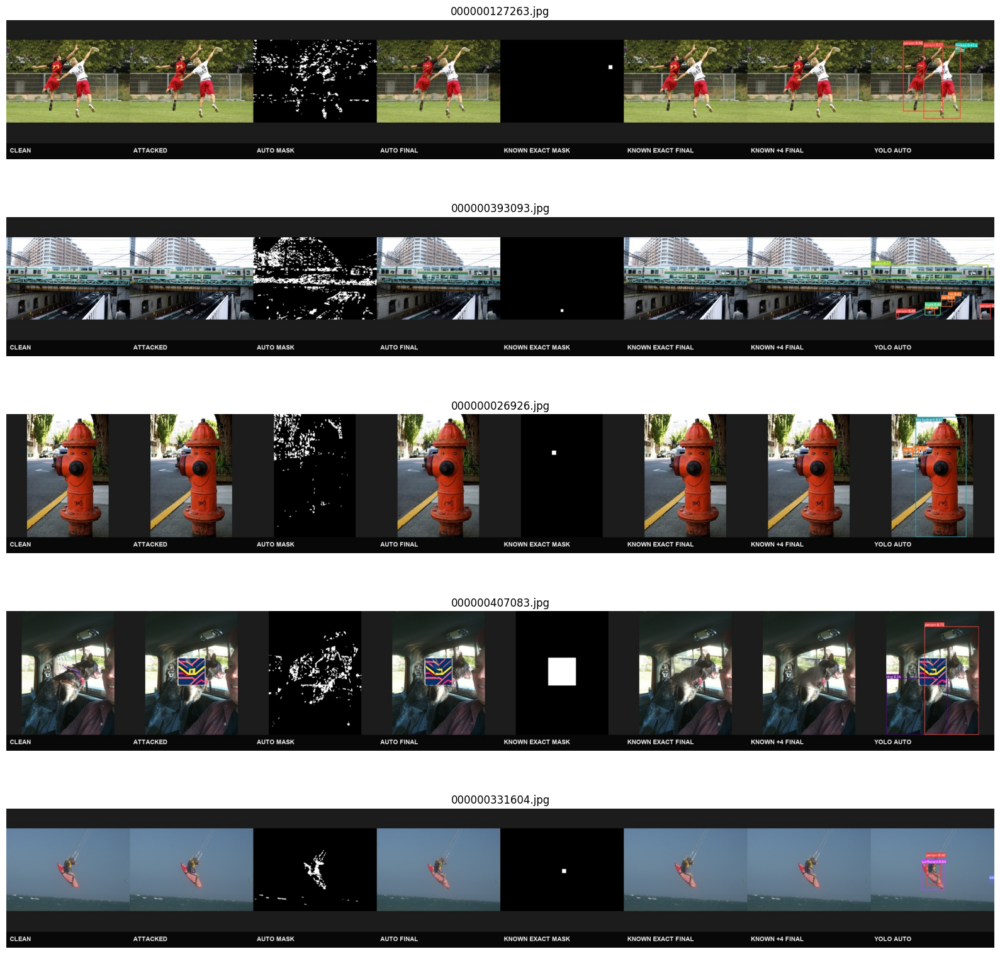

In [14]:
fig, axes = plt.subplots(len(files), 1, figsize=(16, 3.2*len(files)))
if len(files)==1:
    axes = [axes]
for i, fn in enumerate(files):
    axes[i].imshow(Image.open(ROOT/"comparison"/"images"/fn))
    axes[i].set_title(fn)
    axes[i].axis("off")
plt.tight_layout(); plt.show()


## 16. Aggregate diagnostic results


In [15]:
succ = cmp[cmp.case=="attack_success"]
ctrl = cmp[cmp.case=="control"]
print("DIAGNOSTIC SUBSET RECOVERY RATE (not DISPATCH DRR, not paper mAP)")
print(f"Automatic recovered: {int(succ.automatic_recovered.sum())} / {len(succ)}")
print(f"Known Exact recovered: {int(succ.known_exact_recovered.sum())} / {len(succ)}")
print(f"Known +4px recovered: {int(succ.known_expand4_recovered.sum())} / {len(succ)}")
print(f"Automatic mean mask IoU: {cmp.automatic_mask_iou.astype(float).mean():.4f}")
print(f"Automatic mean precision: {cmp.automatic_precision.astype(float).mean():.4f}")
print(f"Automatic mean recall: {cmp.automatic_recall.astype(float).mean():.4f}")
print(f"Automatic controls preserved: {int(ctrl.automatic_control_preserved.sum())} / {len(ctrl)}")
print(f"Known exact controls preserved: {int(ctrl.known_exact_control_preserved.sum())} / {len(ctrl)}")
print(f"Known +4 controls preserved: {int(ctrl.known_expand4_control_preserved.sum())} / {len(ctrl)}")
print("outside-mask MAE exact:\n", cmp[["filename","outside_mask_mae_exact","outside_mask_mae_expand4"]])


DIAGNOSTIC SUBSET RECOVERY RATE (not DISPATCH DRR, not paper mAP)
Automatic recovered: 0 / 4
Known Exact recovered: 2 / 4
Known +4px recovered: 2 / 4
Automatic mean mask IoU: 0.0494
Automatic mean precision: 0.0681
Automatic mean recall: 0.7942
Automatic controls preserved: 1 / 1
Known exact controls preserved: 1 / 1
Known +4 controls preserved: 1 / 1
outside-mask MAE exact:
            filename  outside_mask_mae_exact  outside_mask_mae_expand4
0  000000127263.jpg                     0.0                       0.0
1  000000393093.jpg                     0.0                       0.0
2  000000026926.jpg                     0.0                       0.0
3  000000407083.jpg                     0.0                       0.0
4  000000331604.jpg                     0.0                       0.0


## 17. Explanation of failures

The following cell interprets **this notebook's actual numbers**, not prior experiments.


In [16]:
print("Per-image interpretation from this run:")
for _, r in cmp.iterrows():
    msg = "- %s (%s, %s): mask IoU=%.3f P=%.3f R=%.3f auto=%s exact=%s +4=%s" % (
        r.filename, r.target, r.case, float(r.automatic_mask_iou), float(r.automatic_precision),
        float(r.automatic_recall), r.automatic_recovered, r.known_exact_recovered, r.known_expand4_recovered)
    print(msg)
    print(" ", r.interpretation)
print()
print("If predicted_mask_area >> true_patch_area, Automatic over-segments (KMeans high-difference cluster).")
print("If recall is high but precision is low, the true patch is covered but much extra area is inpainted.")
print("If Known Exact recovers a case Automatic misses, localization is the likely bottleneck.")
print("If both fail, LDM fill and/or Hyper-YOLO IoU>=0.50 matching also limit recovery.")
print("Known Location outside-mask MAE near 0 means compositing did not alter pixels outside the mask.")


Per-image interpretation from this run:
- 000000127263.jpg (car, attack_success): mask IoU=0.020 P=0.020 R=0.938 auto=False exact=False +4=False
  Case C: both fail — localization alone does not explain failure.
- 000000393093.jpg (car, attack_success): mask IoU=0.004 P=0.004 R=0.974 auto=False exact=True +4=True
  Case A: Automatic fail / known succeed — localization likely bottleneck.
- 000000026926.jpg (car, attack_success): mask IoU=0.027 P=0.027 R=0.862 auto=False exact=False +4=False
  Case C: both fail — localization alone does not explain failure.
- 000000407083.jpg (car, attack_success): mask IoU=0.112 P=0.205 R=0.198 auto=False exact=True +4=True
  Case A: Automatic fail / known succeed — localization likely bottleneck.
- 000000331604.jpg (person, control): mask IoU=0.085 P=0.085 R=1.000 auto=False exact=False +4=False
  control

If predicted_mask_area >> true_patch_area, Automatic over-segments (KMeans high-difference cluster).
If recall is high but precision is low, the tru

## 18. Limitations

- Only five diagnostic images (4 attack-success + 1 control).
- Known Location uses oracle patch coordinates; that is **not** Automatic DISPATCH.
- Automatic KMeans masks are often oversized relative to the true square.
- CompVis LDM generates plausible pixels; it does not paste the original clean object.
- Hyper-YOLO matching is strict: same class and GT IoU ≥ 0.50.
- This COCO / Hyper-YOLO / attack_02 setup is **not** the paper INRIA-Person / MMDetection / AdvPatch benchmark, so paper mAP@0.5 cannot be expected here.


## 19. Conclusion

Filled from the executed tables in the next cell.


In [17]:
n_s = len(succ)
ar = int(succ.automatic_recovered.sum())
er = int(succ.known_exact_recovered.sum())
xr = int(succ.known_expand4_recovered.sum())
miou = float(cmp.automatic_mask_iou.astype(float).mean())
print("A. Did Automatic localize patches accurately?")
print("   Mean mask IoU = %.4f. High recall with low precision means the patch is usually covered but the mask is oversized, not a tight square." % miou)
print("B. Did Automatic restore target detections?")
print(f"   Diagnostic recovery {ar} / {n_s} attack-success images.")
print("C. Did Known Location perform better?")
print(f"   Exact {er}/{n_s}; this is an oracle mask, not Automatic.")
print("D. Did +4 expansion help?")
print(f"   +4px {xr}/{n_s}.")
print("E. Bottleneck?")
if er > ar and xr >= er:
    print("   Mixed, with localization as a major Automatic bottleneck (known recovers extra cases).")
elif ar == 0 and er == 0:
    print("   Restoration/LDM/detector limits dominate; localization alone does not explain all failures.")
else:
    print("   Mixed: inspect per-image interpretation column.")
print()
print("Clean pixels were never used for inpainting or compositing.")
print("True patch coordinates were not supplied to Automatic localization.")


A. Did Automatic localize patches accurately?
   Mean mask IoU = 0.0494. High recall with low precision means the patch is usually covered but the mask is oversized, not a tight square.
B. Did Automatic restore target detections?
   Diagnostic recovery 0 / 4 attack-success images.
C. Did Known Location perform better?
   Exact 2/4; this is an oracle mask, not Automatic.
D. Did +4 expansion help?
   +4px 2/4.
E. Bottleneck?
   Mixed, with localization as a major Automatic bottleneck (known recovers extra cases).

Clean pixels were never used for inpainting or compositing.
True patch coordinates were not supplied to Automatic localization.


## 20. Write-safety hashes

External dependency files are hashed before and after this notebook run. They must be unchanged.


In [18]:
from helpers.safety import sha256_file, assert_writable, ensure_dir
import hashlib

before = json.loads((ROOT/"safety"/"hashes_before.json").read_text(encoding="utf-8"))
after = {}
for path in before:
    p = Path(path)
    after[path] = sha256_file(p)
ensure_dir(ROOT/"safety")
(assert_writable(ROOT/"safety"/"hashes_after.json")).write_text(json.dumps(after, indent=2), encoding="utf-8")
changed = [k for k in before if before[k]["sha256"] != after[k]["sha256"]]
checks = {
    "notebook_exists": (ROOT/"dispatch_defense_experiment.ipynb").is_file(),
    "five_clean": all((ROOT/"source_data"/"clean_images"/fn).is_file() for fn in files),
    "five_attacked": all((ROOT/"source_data"/"attacked_images"/fn).is_file() for fn in files),
    "automatic_restored": all((ROOT/"automatic"/"restored_images"/fn).is_file() for fn in files),
    "known_exact": all((ROOT/"known_location"/"restored_images"/"exact_mask"/fn).is_file() for fn in files),
    "known_plus4": all((ROOT/"known_location"/"restored_images"/"expanded_4px"/fn).is_file() for fn in files),
    "comparison_images": all((ROOT/"comparison"/"images"/fn).is_file() for fn in files),
    "readme": (ROOT/"README.txt").is_file(),
    "open_bat": (ROOT/"open_notebook.bat").is_file(),
    "run_bat": (ROOT/"run_notebook.bat").is_file(),
    "external_hashes_unchanged": len(changed)==0,
}
lines = ["VALIDATION REPORT", "="*40]
for k,v in checks.items():
    lines.append(f"{k}: {'YES' if v else 'NO'}")
lines.append("changed_external_files: " + (", ".join(changed) if changed else "NONE"))
report = "\n".join(lines) + "\n"
(assert_writable(ROOT/"safety"/"validation_report.txt")).write_text(report, encoding="utf-8")
print(report)
if changed:
    raise RuntimeError("External dependency files changed: " + ", ".join(changed))
if not all(checks.values()):
    raise RuntimeError("Validation failed: " + str(checks))
print("Safety confirmation: all new files stayed under DISPATCH-Teacher-Notebook.")


VALIDATION REPORT
notebook_exists: YES
five_clean: YES
five_attacked: YES
automatic_restored: YES
known_exact: YES
known_plus4: YES
comparison_images: YES
readme: YES
open_bat: YES
run_bat: YES
external_hashes_unchanged: YES
changed_external_files: NONE

Safety confirmation: all new files stayed under DISPATCH-Teacher-Notebook.
